In [86]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy
import seaborn as sns

from datafold import (
    EDMD,
    DMDStandard,
    GaussianKernel,
    TSCPolynomialFeatures,
    TSCRadialBasis,
    TSCDataFrame,
    TSCTakensEmbedding
)
from datafold.utils._systems import Hopf
from datafold.utils.general import generate_2d_regular_mesh

import errors
import models
import utils
import random

In [7]:
dfs = []

for i in range(1,31):
    file_path =  f"input_data/bottleneck_3door/density_mesh{i}.txt"
    df = pd.read_csv(file_path, sep=" ")
    value1 = i-1
    df.insert(0, 'id', value1)
    df.set_index(['id','timeStep'], inplace = True)

    temp_column = df.pop('meshDensityCounting-PID16')
    #df.reset_index(inplace=True)
    df['meshDensityCounting-PID16'] = temp_column

    temp_column = df.pop('meshDensityCounting-PID19')
    #df.reset_index(inplace=True)
    df['meshDensityCounting-PID19'] = temp_column
    
    data = df
    new_column_names = []

    for j in range(0,len(data.columns)):
        if j == 0:
            new_column_names.append(data.columns[j])
        else:
            new_column_names.append('measurement_area' + str(j))
    data.columns = new_column_names
    data.fillna(0, inplace=True)

    sums_data= data.groupby(['id','timeStep']).sum()
    sums_data.drop(columns=['faceId'], inplace=True)
    #sums_data
    #sums_data.drop(columns=['run_id'], inplace =True)
    #sums_data.insert(0, 'id', i-1)

    dfs.append(sums_data)

result_df = pd.concat(dfs, ignore_index=False)

result_df

measurement_area1  measurement_area2  measurement_area3  \
id timeStep                                                            
0  1                     242.0              231.0                0.0   
   2                     242.0              231.0                0.0   
   3                     246.0              241.0                0.0   
   4                     238.0              248.0                0.0   
   5                     233.0              247.0                0.0   
...                        ...                ...                ...   
29 1247                    0.0                0.0                0.0   
   1248                    0.0                0.0                0.0   
   1249                    0.0                0.0                0.0   
   1250                    0.0                0.0                0.0   
   1251                    0.0                0.0                0.0   

             measurement_area4  measurement_area5  measurement_area6  
id timeStep                                                           
0  1                       0.0                0.0                968  
   2                       0.0                0.0                968  
   3                       0.0                0.0                986  
   4                       0.0                0.0                990  
   5                       0.0                0.0                990  
...                        ...                ...                ...  
29 1247                    0.0                0.0                  0  
   1248                    0.0                0.0                  0  
   1249                    0.0                0.0                  0  
   1250                    0.0                0.0                  0  
   1251                    0.0                0.0                  0  

[37530 rows x 6 columns]

In [8]:
#result_df.set_index(['id', 'timeStep'], append=True, inplace=True)
data_final = result_df
data_reset_index = data_final.reset_index()
last_column_df = data_reset_index.loc[:, ['id', 'timeStep', data_reset_index.columns[-1]]]
last_column_df = last_column_df.rename(columns={'id': 'id', 'timeStep': 'timeStep'})
last_column_df.set_index(['id', 'timeStep'], inplace=True)
data_final = data_reset_index.iloc[:, :-1]
data_final = data_final.rename(columns={'id': 'id', 'timeStep': 'timeStep'})
data_final.set_index(['id', 'timeStep'], inplace=True)

data_final

measurement_area1  measurement_area2  measurement_area3  \
id timeStep                                                            
0  1                     242.0              231.0                0.0   
   2                     242.0              231.0                0.0   
   3                     246.0              241.0                0.0   
   4                     238.0              248.0                0.0   
   5                     233.0              247.0                0.0   
...                        ...                ...                ...   
29 1247                    0.0                0.0                0.0   
   1248                    0.0                0.0                0.0   
   1249                    0.0                0.0                0.0   
   1250                    0.0                0.0                0.0   
   1251                    0.0                0.0                0.0   

             measurement_area4  measurement_area5  
id timeStep                                        
0  1                       0.0                0.0  
   2                       0.0                0.0  
   3                       0.0                0.0  
   4                       0.0                0.0  
   5                       0.0                0.0  
...                        ...                ...  
29 1247                    0.0                0.0  
   1248                    0.0                0.0  
   1249                    0.0                0.0  
   1250                    0.0                0.0  
   1251                    0.0                0.0  

[37530 rows x 5 columns]

In [10]:
seed_value = 42
random.seed(seed_value)
random_train = random.sample(range(30), 14)
remaining_numbers = list(set(range(30)) - set(random_train))
random_valid = random.sample(remaining_numbers, 14)
remaining_numbers = list(set(remaining_numbers) - set(random_valid))

# Select 2 more unique random numbers from the updated remaining pool
random_test = random.sample(remaining_numbers, 2)
print(random_train)
print(random_valid)
print(random_test)

[20, 3, 0, 23, 8, 7, 24, 4, 28, 17, 2, 18, 13, 1]
[5, 6, 10, 26, 16, 19, 29, 22, 25, 12, 14, 11, 15, 21]
[27, 9]


In [12]:
random_final_input = random_train + random_valid

In [13]:
data_train = []
count=0
for i in random_train:
   temp_df = data_final.loc[(i, slice(None)), :]
   #temp_df.insert(0, 'id', count)
   #temp_df.set_index('id', append=True, inplace = True)
   
   temp_df = temp_df.rename(index={i:count}, level='id')
   count=count+1
   data_train.append(temp_df)

final_data_train = pd.concat(data_train, ignore_index=False)

final_data_train

measurement_area1  measurement_area2  measurement_area3  \
id timeStep                                                            
0  1                     247.0              254.0                0.0   
   2                     247.0              254.0                0.0   
   3                     242.0              253.0                0.0   
   4                     241.0              255.0                0.0   
   5                     232.0              261.0                0.0   
...                        ...                ...                ...   
13 1247                    0.0                0.0                0.0   
   1248                    0.0                0.0                0.0   
   1249                    0.0                0.0                0.0   
   1250                    0.0                0.0                0.0   
   1251                    0.0                0.0                0.0   

             measurement_area4  measurement_area5  
id timeStep                                        
0  1                       0.0                0.0  
   2                       0.0                0.0  
   3                       0.0                0.0  
   4                       0.0                0.0  
   5                       0.0                0.0  
...                        ...                ...  
13 1247                    0.0                0.0  
   1248                    0.0                0.0  
   1249                    0.0                0.0  
   1250                    0.0                0.0  
   1251                    0.0                0.0  

[17514 rows x 5 columns]

In [14]:
data_valid = []
count=0
for i in random_valid:
   temp_df = data_final.loc[(i, slice(None)), :]
   #temp_df.insert(0, 'id', count)
   #temp_df.set_index('id', append=True, inplace = True)
   
   temp_df = temp_df.rename(index={i:count}, level='id')
   count=count+1
   data_valid.append(temp_df)

final_data_valid = pd.concat(data_valid, ignore_index=False)

final_data_valid

measurement_area1  measurement_area2  measurement_area3  \
id timeStep                                                            
0  1                     247.0              224.0                0.0   
   2                     247.0              224.0                0.0   
   3                     249.0              224.0                0.0   
   4                     248.0              233.0                0.0   
   5                     241.0              233.0                0.0   
...                        ...                ...                ...   
13 1247                    0.0                0.0                0.0   
   1248                    0.0                0.0                0.0   
   1249                    0.0                0.0                0.0   
   1250                    0.0                0.0                0.0   
   1251                    0.0                0.0                0.0   

             measurement_area4  measurement_area5  
id timeStep                                        
0  1                       0.0                0.0  
   2                       0.0                0.0  
   3                       0.0                0.0  
   4                       0.0                0.0  
   5                       0.0                0.0  
...                        ...                ...  
13 1247                    0.0                0.0  
   1248                    0.0                0.0  
   1249                    0.0                0.0  
   1250                    0.0                0.0  
   1251                    0.0                0.0  

[17514 rows x 5 columns]

In [15]:
data_final_input = []
count=0
for i in random_final_input:
   temp_df = data_final.loc[(i, slice(None)), :]
   #temp_df.insert(0, 'id', count)
   #temp_df.set_index('id', append=True, inplace = True)
   
   temp_df = temp_df.rename(index={i:count}, level='id')
   count=count+1
   data_final_input.append(temp_df)

final_data_input = pd.concat(data_final_input, ignore_index=False)

final_data_input

measurement_area1  measurement_area2  measurement_area3  \
id timeStep                                                            
0  1                     247.0              254.0                0.0   
   2                     247.0              254.0                0.0   
   3                     242.0              253.0                0.0   
   4                     241.0              255.0                0.0   
   5                     232.0              261.0                0.0   
...                        ...                ...                ...   
27 1247                    0.0                0.0                0.0   
   1248                    0.0                0.0                0.0   
   1249                    0.0                0.0                0.0   
   1250                    0.0                0.0                0.0   
   1251                    0.0                0.0                0.0   

             measurement_area4  measurement_area5  
id timeStep                                        
0  1                       0.0                0.0  
   2                       0.0                0.0  
   3                       0.0                0.0  
   4                       0.0                0.0  
   5                       0.0                0.0  
...                        ...                ...  
27 1247                    0.0                0.0  
   1248                    0.0                0.0  
   1249                    0.0                0.0  
   1250                    0.0                0.0  
   1251                    0.0                0.0  

[35028 rows x 5 columns]

In [16]:
data_test = []
count=0
for i in random_test:
   temp_df = data_final.loc[(i, slice(None)), :]
   #temp_df.insert(0, 'id', count)
   #temp_df.set_index('id', append=True, inplace = True)
   
   temp_df = temp_df.rename(index={i:count}, level='id')
   count=count+1
   data_test.append(temp_df)

final_data_test = pd.concat(data_test, ignore_index=False)

final_data_test

measurement_area1  measurement_area2  measurement_area3  \
id timeStep                                                            
0  1                     239.0              243.0                0.0   
   2                     239.0              243.0                0.0   
   3                     243.0              248.0                0.0   
   4                     235.0              248.0                0.0   
   5                     231.0              252.0                0.0   
...                        ...                ...                ...   
1  1247                    0.0                0.0                0.0   
   1248                    0.0                0.0                0.0   
   1249                    0.0                0.0                0.0   
   1250                    0.0                0.0                0.0   
   1251                    0.0                0.0                0.0   

             measurement_area4  measurement_area5  
id timeStep                                        
0  1                       0.0                0.0  
   2                       0.0                0.0  
   3                       0.0                0.0  
   4                       0.0                0.0  
   5                       0.0                0.0  
...                        ...                ...  
1  1247                    0.0                0.0  
   1248                    0.0                0.0  
   1249                    0.0                0.0  
   1250                    0.0                0.0  
   1251                    0.0                0.0  

[2502 rows x 5 columns]

In [17]:
x_tsc_train = TSCDataFrame.from_frame_list([final_data_train]).astype(np.float64)
x_tsc_valid = TSCDataFrame.from_frame_list([final_data_valid]).astype(np.float64)
x_tsc_input = TSCDataFrame.from_frame_list([final_data_input]).astype(np.float64)
x_tsc_test = TSCDataFrame.from_frame_list([final_data_test]).astype(np.float64)

In [18]:
x_tsc_train

feature  measurement_area1  measurement_area2  measurement_area3  \
ID time                                                            
0  1                 247.0              254.0                0.0   
   2                 247.0              254.0                0.0   
   3                 242.0              253.0                0.0   
   4                 241.0              255.0                0.0   
   5                 232.0              261.0                0.0   
...                    ...                ...                ...   
13 1247                0.0                0.0                0.0   
   1248                0.0                0.0                0.0   
   1249                0.0                0.0                0.0   
   1250                0.0                0.0                0.0   
   1251                0.0                0.0                0.0   

feature  measurement_area4  measurement_area5  
ID time                                        
0  1                   0.0                0.0  
   2                   0.0                0.0  
   3                   0.0                0.0  
   4                   0.0                0.0  
   5                   0.0                0.0  
...                    ...                ...  
13 1247                0.0                0.0  
   1248                0.0                0.0  
   1249                0.0                0.0  
   1250                0.0                0.0  
   1251                0.0                0.0  

[17514 rows x 5 columns]

In [19]:
x_tsc_valid

feature  measurement_area1  measurement_area2  measurement_area3  \
ID time                                                            
0  1                 247.0              224.0                0.0   
   2                 247.0              224.0                0.0   
   3                 249.0              224.0                0.0   
   4                 248.0              233.0                0.0   
   5                 241.0              233.0                0.0   
...                    ...                ...                ...   
13 1247                0.0                0.0                0.0   
   1248                0.0                0.0                0.0   
   1249                0.0                0.0                0.0   
   1250                0.0                0.0                0.0   
   1251                0.0                0.0                0.0   

feature  measurement_area4  measurement_area5  
ID time                                        
0  1                   0.0                0.0  
   2                   0.0                0.0  
   3                   0.0                0.0  
   4                   0.0                0.0  
   5                   0.0                0.0  
...                    ...                ...  
13 1247                0.0                0.0  
   1248                0.0                0.0  
   1249                0.0                0.0  
   1250                0.0                0.0  
   1251                0.0                0.0  

[17514 rows x 5 columns]

In [20]:
x_tsc_input

feature  measurement_area1  measurement_area2  measurement_area3  \
ID time                                                            
0  1                 247.0              254.0                0.0   
   2                 247.0              254.0                0.0   
   3                 242.0              253.0                0.0   
   4                 241.0              255.0                0.0   
   5                 232.0              261.0                0.0   
...                    ...                ...                ...   
27 1247                0.0                0.0                0.0   
   1248                0.0                0.0                0.0   
   1249                0.0                0.0                0.0   
   1250                0.0                0.0                0.0   
   1251                0.0                0.0                0.0   

feature  measurement_area4  measurement_area5  
ID time                                        
0  1                   0.0                0.0  
   2                   0.0                0.0  
   3                   0.0                0.0  
   4                   0.0                0.0  
   5                   0.0                0.0  
...                    ...                ...  
27 1247                0.0                0.0  
   1248                0.0                0.0  
   1249                0.0                0.0  
   1250                0.0                0.0  
   1251                0.0                0.0  

[35028 rows x 5 columns]

In [21]:
x_tsc_test

feature  measurement_area1  measurement_area2  measurement_area3  \
ID time                                                            
0  1                 239.0              243.0                0.0   
   2                 239.0              243.0                0.0   
   3                 243.0              248.0                0.0   
   4                 235.0              248.0                0.0   
   5                 231.0              252.0                0.0   
...                    ...                ...                ...   
1  1247                0.0                0.0                0.0   
   1248                0.0                0.0                0.0   
   1249                0.0                0.0                0.0   
   1250                0.0                0.0                0.0   
   1251                0.0                0.0                0.0   

feature  measurement_area4  measurement_area5  
ID time                                        
0  1                   0.0                0.0  
   2                   0.0                0.0  
   3                   0.0                0.0  
   4                   0.0                0.0  
   5                   0.0                0.0  
...                    ...                ...  
1  1247                0.0                0.0  
   1248                0.0                0.0  
   1249                0.0                0.0  
   1250                0.0                0.0  
   1251                0.0                0.0  

[2502 rows x 5 columns]

In [ ]:
dmd = models.dmd(x_tsc_train)
dmd_values_train = dmd.predict(x_tsc_train.initial_states(), time_values=x_tsc_train.time_values())
x_predicted_dmd_train = dmd_values_train
train_dmd_mae, train_dmd_mse, train_dmd_rmse,_,_ = errors.compiled_errors(x_tsc_valid, x_predicted_dmd_train)

dmd_values_valid = dmd.predict(x_tsc_valid.initial_states(), time_values=x_tsc_valid.time_values())
x_predicted_dmd_valid = dmd_values_valid
valid_dmd_mae, valid_dmd_mse, valid_dmd_rmse,_,_ = errors.compiled_errors(x_tsc_valid, x_predicted_dmd_valid)

In [23]:
print('Training error for basic DMD')
print(f"train_mae: {train_dmd_mae}")
print(f"train_mse: {train_dmd_mse}")
print(f"train_rmse: {train_dmd_rmse}")
print("\n")
print('Validation error for basic DMD')
print(f"validation mae: {valid_dmd_mae}")
print(f"validation mse: {valid_dmd_mse}")
print(f"validation rmse: {valid_dmd_rmse}")

Training error for basic DMD
train_mae: 23.87170076886003
train_mse: 1775.1491452062044
train_rmse: 42.13251885665281


Validation error for basic DMD
validation mae: 23.854933070345595
validation mse: 1776.5130715169803
validation rmse: 42.1487018959894


In [ ]:
dmd_values_test = dmd.predict(x_tsc_input.initial_states(), time_values=x_tsc_input.time_values())
x_predicted_dmd_test = dmd_values_test
test_dmd_mae, test_dmd_mse, test_dmd_rmse,_,_ = errors.compiled_errors(x_tsc_test, x_predicted_dmd_test)

In [25]:
print('Testing error')
print(f"Testing mae:{test_dmd_mae}")
print(f"Testing mse:{test_dmd_mse}")
print(f"Testing rmse:{test_dmd_rmse}")

Testing error
Testing mae:22.68345771522747
Testing mse:1459.1656917210553
Testing rmse:38.19902736616543


In [ ]:
num_columns = x_tsc_train.shape[1]
train_error = {}
valid_error = {}

for rank in range(1, num_columns +1):
    if rank == num_columns:
        dmd = models.dmd(x_tsc_train)
    else:
        dmd = models.dmd(x_tsc_train, rank = rank)
    
    dmd_values_train = dmd.predict(x_tsc_train.initial_states(), time_values=x_tsc_train.time_values())
    x_predicted_dmd_train = dmd_values_train
    train_dmd_mae, train_dmd_mse, train_dmd_rmse,_,_  = errors.compiled_errors(x_tsc_train, x_predicted_dmd_train)

    train_error[rank] = {'mae': train_dmd_mae, 'mse' : train_dmd_mse, 'rmse': train_dmd_rmse}

    dmd_values_valid = dmd.predict(x_tsc_valid.initial_states(), time_values=x_tsc_valid.time_values())
    x_predicted_dmd_valid = dmd_values_valid
    valid_dmd_mae, valid_dmd_mse, valid_dmd_rmse,_,_  = errors.compiled_errors(x_tsc_valid, x_predicted_dmd_valid)
    
    valid_error[rank] = {'mae': valid_dmd_mae, 'mse' : valid_dmd_mse, 'rmse': valid_dmd_rmse}

In [27]:
print(f"Training error only for DMD: {train_error}")
print(f"Validation error only for DMD: {valid_error}")

Training error only for DMD: {1: {'mae': 24.442694596170394, 'mse': 3496.7651624530467, 'rmse': 59.133452143884234}, 2: {'mae': 33.45620456871236, 'mse': 3891.382010087336, 'rmse': 62.38094268354187}, 3: {'mae': 24.103373080334272, 'mse': 1992.6307435359697, 'rmse': 44.638892723005235}, 4: {'mae': 20.876672511483854, 'mse': 1619.7785011740111, 'rmse': 40.24647190964708}, 5: {'mae': 22.773609096401486, 'mse': 1609.8455104116779, 'rmse': 40.12288013604803}}
Validation error only for DMD: {1: {'mae': 24.162050689291778, 'mse': 3428.4175198425773, 'rmse': 58.55269011619003}, 2: {'mae': 33.321861944686106, 'mse': 3836.699075353886, 'rmse': 61.94109359184649}, 3: {'mae': 24.900368379612026, 'mse': 2125.330282785114, 'rmse': 46.10130456706311}, 4: {'mae': 21.900322468485616, 'mse': 1790.4509949307303, 'rmse': 42.313721118931745}, 5: {'mae': 23.854933070345595, 'mse': 1776.5130715169803, 'rmse': 42.1487018959894}}


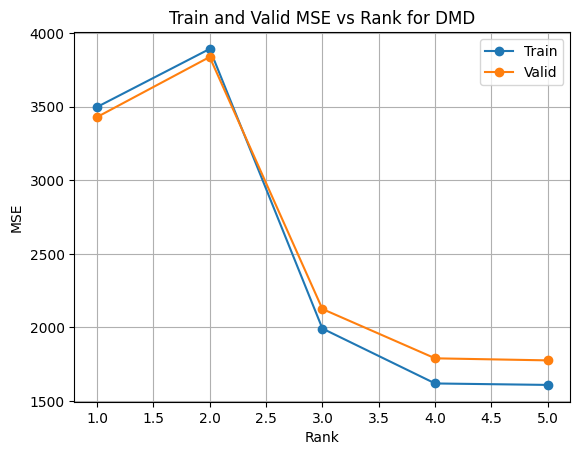

In [28]:
ranks = list(train_error.keys())
train_mse_values = [train_error[rank]['mse'] for rank in ranks]
valid_mse_values = [valid_error[rank]['mse'] for rank in ranks]

# Create the plot
plt.plot(ranks, train_mse_values, marker='o', linestyle='-', label='Train')
plt.plot(ranks, valid_mse_values, marker='o', linestyle='-', label='Valid')
plt.xlabel('Rank')
plt.ylabel('MSE')
plt.title('Train and Valid MSE vs Rank for DMD')
plt.legend()
plt.grid(True)
plt.show()

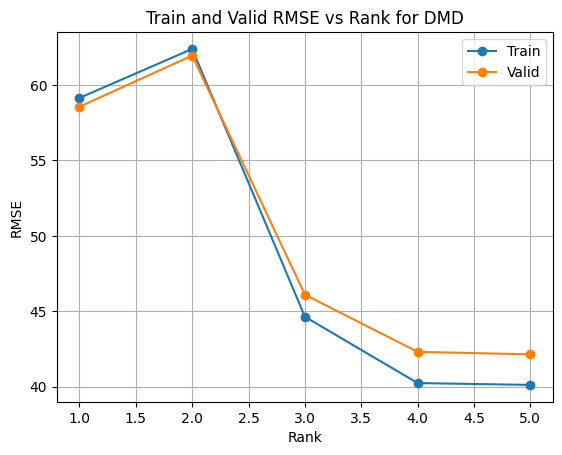

In [29]:
ranks = list(train_error.keys())
train_rmse_values = [train_error[rank]['rmse'] for rank in ranks]
valid_rmse_values = [valid_error[rank]['rmse'] for rank in ranks]

# Create the plot
plt.plot(ranks, train_rmse_values, marker='o', linestyle='-', label='Train')
plt.plot(ranks, valid_rmse_values, marker='o', linestyle='-', label='Valid')
plt.xlabel('Rank')
plt.ylabel('RMSE')
plt.title('Train and Valid RMSE vs Rank for DMD')
plt.legend()
plt.grid(True)
plt.show()

In [30]:
num_columns = x_tsc_input.shape[1]

min_mse_key = min(valid_error, key=lambda k: valid_error[k]['mse'])
min_mse_value = valid_error[min_mse_key]['mse']

if min_mse_key == num_columns:
    dmd = models.dmd(x_tsc_input)
else:
    dmd = models.dmd(x_tsc_input, rank = min_mse_key)

dmd_values_test = dmd.predict(x_tsc_test.initial_states(), time_values=x_tsc_test.time_values())
x_predicted_dmd_test = dmd_values_test
test_dmd_mae, test_dmd_mse, test_dmd_rmse,_,_  = errors.compiled_errors(x_tsc_test, x_predicted_dmd_test)

/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).head(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1666: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).tail(


In [31]:
print(f"DMD Rank for minimum MSE : {min_mse_key}")
print(f"Minimum MSE value : {min_mse_value}")
print(f"\n")
print('Testing error')
print(f"Testing mae:{test_dmd_mae}")
print(f"Testing mse:{test_dmd_mse}")
print(f"Testing rmse:{test_dmd_rmse}")

DMD Rank for minimum MSE : 5
Minimum MSE value : 1776.5130715169803


Testing error
Testing mae:21.09523623962486
Testing mse:1312.146094401771
Testing rmse:36.223557174879595


In [32]:
time_delay_embed = TSCTakensEmbedding(delays=10, lag=0, frequency=1, kappa=0).fit(x_tsc_train)
embed_values_train = time_delay_embed.transform(x_tsc_train)
embed_values_valid = time_delay_embed.transform(x_tsc_valid)
embed_values_input = time_delay_embed.transform(x_tsc_input)
embed_values_test = time_delay_embed.transform(x_tsc_test)

#embed_values_new_train = time_delay_embed.inverse_transform(embed_values_train)
#embed_values_train

In [33]:
dmd = models.dmd(embed_values_train)
dmd_values_tde_train = dmd.predict(embed_values_train.initial_states(), time_values=embed_values_train.time_values())

x_alternate_train = time_delay_embed.inverse_transform(dmd_values_tde_train)

    #dmd_mae_new, dmd_mse_new, dmd_rmse_new, dmd_mape_new, dmd_r_squared_new = errors.compiled_errors(embed_values, x_predicted_dmd_new)
x_time_delay_train_init = x_tsc_train.iloc[10:]
train_tde_dmd_mae, train_tde_dmd_mse, train_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_train_init, x_alternate_train)

dmd_values_tde_valid = dmd.predict(embed_values_valid.initial_states(), time_values=embed_values_valid.time_values())

x_alternate_valid = time_delay_embed.inverse_transform(dmd_values_tde_valid)

    #dmd_mae_new, dmd_mse_new, dmd_rmse_new, dmd_mape_new, dmd_r_squared_new = errors.compiled_errors(embed_values, x_predicted_dmd_new)
x_time_delay_valid_init = x_tsc_valid.iloc[10:]
valid_tde_dmd_mae, valid_tde_dmd_mse, valid_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_valid_init, x_alternate_valid)

/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).head(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1666: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).tail(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future v

In [34]:
print('Training error for basic time delay embedding and DMD')
print(f"train_mae: {train_tde_dmd_mae}")
print(f"train_mse: {train_tde_dmd_mse}")
print(f"train_rmse: {train_tde_dmd_rmse}")
print("\n")
print('Validation error for basic time delay embedding and DMD')
print(f"validation mae: {valid_tde_dmd_mae}")
print(f"validation mse: {valid_tde_dmd_mse}")
print(f"validation rmse: {valid_tde_dmd_rmse}")

Training error for basic time delay embedding and DMD
train_mae: 10.793621287234334
train_mse: 1084.0173974621266
train_rmse: 32.92441947038895


Validation error for basic time delay embedding and DMD
validation mae: 11.915716855627272
validation mse: 1256.0963639151473
validation rmse: 35.44144979984802


In [ ]:
num_columns = embed_values_train.shape[1]
x_time_delay_train_init = x_tsc_train.iloc[10:]
train_error_tde = {}
valid_error_tde = {}

for rank in range(1, num_columns +1):
    if rank == num_columns:
        dmd = models.dmd(embed_values_train)
    else:
        dmd = models.dmd(embed_values_train, rank = rank)
    
    dmd_values_new_train = dmd.predict(embed_values_train.initial_states(), time_values=embed_values_train.time_values())
    x_alternate_train = time_delay_embed.inverse_transform(dmd_values_new_train)
    train_tde_dmd_mae, train_tde_dmd_mse, train_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_train_init, x_alternate_train)
    train_error_tde[rank] = {'mae': train_tde_dmd_mae, 'mse' : train_tde_dmd_mse, 'rmse': train_tde_dmd_rmse}

    dmd_values_new_valid = dmd.predict(embed_values_valid.initial_states(), time_values=embed_values_valid.time_values())
    x_alternate_valid = time_delay_embed.inverse_transform(dmd_values_new_valid)
    valid_tde_dmd_mae, valid_tde_dmd_mse, valid_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_valid_init, x_alternate_valid)
    valid_error_tde[rank] = {'mae': valid_tde_dmd_mae, 'mse' : valid_tde_dmd_mse, 'rmse': valid_tde_dmd_rmse}

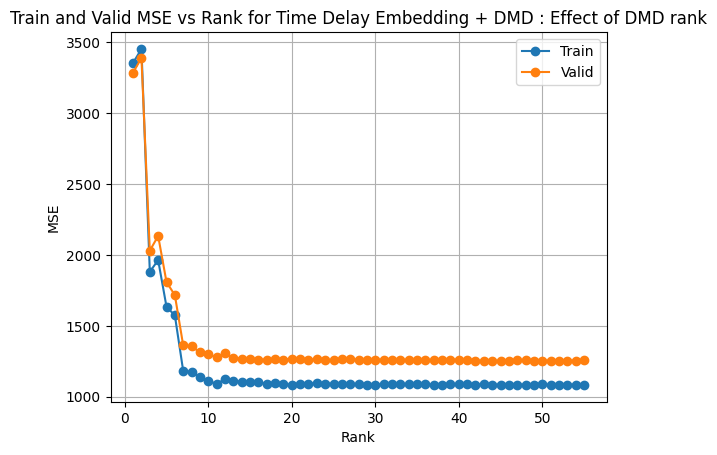

In [36]:
ranks = list(train_error_tde.keys())
train_tde_mse_values = [train_error_tde[rank]['mse'] for rank in ranks]
valid_tde_mse_values = [valid_error_tde[rank]['mse'] for rank in ranks]

# Create the plot
plt.plot(ranks, train_tde_mse_values, marker='o', linestyle='-', label='Train')
plt.plot(ranks, valid_tde_mse_values, marker='o', linestyle='-', label='Valid')
plt.xlabel('Rank')
plt.ylabel('MSE')
plt.title('Train and Valid MSE vs Rank for Time Delay Embedding + DMD : Effect of DMD rank')
plt.legend()
plt.grid(True)
plt.show()

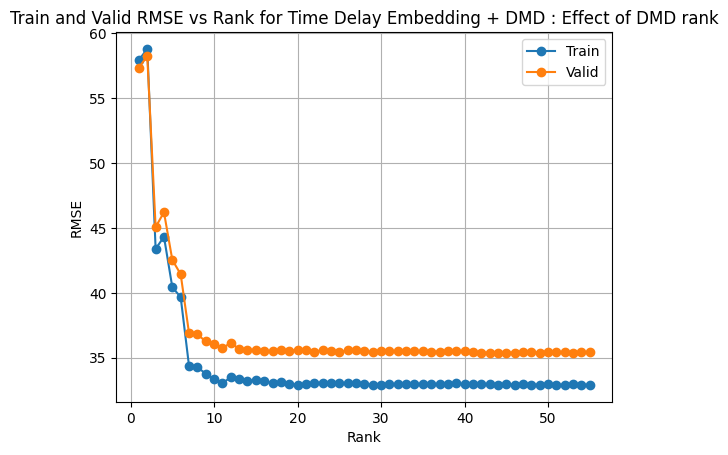

In [37]:
ranks = list(train_error_tde.keys())
train_tde_mse_values = [train_error_tde[rank]['rmse'] for rank in ranks]
valid_tde_mse_values = [valid_error_tde[rank]['rmse'] for rank in ranks]

# Create the plot
plt.plot(ranks, train_tde_mse_values, marker='o', linestyle='-', label='Train')
plt.plot(ranks, valid_tde_mse_values, marker='o', linestyle='-', label='Valid')
plt.xlabel('Rank')
plt.ylabel('RMSE')
plt.title('Train and Valid RMSE vs Rank for Time Delay Embedding + DMD : Effect of DMD rank')
plt.legend()
plt.grid(True)
plt.show()

In [38]:
num_columns = x_tsc_input.shape[1]

min_mse_tde_key = min(valid_error_tde, key=lambda k: valid_error_tde[k]['mse'])
min_mse_tde_value = valid_error_tde[min_mse_tde_key]['mse']

x_time_delay_test_init = x_tsc_test.iloc[10:]

if min_mse_tde_key == num_columns:
    dmd = models.dmd(embed_values_input)
else:
    dmd = models.dmd(embed_values_input, rank = min_mse_tde_key)
    
dmd_values_new_test = dmd.predict(embed_values_test.initial_states(), time_values=embed_values_test.time_values())
x_alternate_test = time_delay_embed.inverse_transform(dmd_values_new_test)
test_tde_dmd_mae, test_tde_dmd_mse, test_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_test_init, x_alternate_test)


/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).head(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1666: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).tail(


In [39]:
print(f"DMD Rank for minimum MSE : {min_mse_tde_key}")
print(f"Minimum MSE value : {min_mse_tde_value}")
print(f"\n")
print('Testing error')
print(f"Testing mae:{test_tde_dmd_mae}")
print(f"Testing mse:{test_tde_dmd_mse}")
print(f"Testing rmse:{test_tde_dmd_rmse}")

DMD Rank for minimum MSE : 44
Minimum MSE value : 1252.145326208831


Testing error
Testing mae:9.00364431563695
Testing mse:591.2833629901139
Testing rmse:24.316318861828446


In [45]:
train_error_tde2 = {}
valid_error_tde2 = {}

for delay in range(1,60):
    time_delay_embed = TSCTakensEmbedding(delays=delay, lag=0, frequency=1, kappa=0).fit(x_tsc_train)
    embed_values_train = time_delay_embed.transform(x_tsc_train)
    embed_values_valid = time_delay_embed.transform(x_tsc_valid)
    num_columns = embed_values_train.shape[1]

    x_time_delay_train_tde_init = x_tsc_train.iloc[delay:]
    x_time_delay_valid_tde_init = x_tsc_valid.iloc[delay:]

    dmd = models.dmd(embed_values_train)
    dmd_values_train_tde_new = dmd.predict(embed_values_train.initial_states(), time_values=embed_values_train.time_values())
    x_predicted_dmd_train_tde_new = dmd_values_train_tde_new

    x_alternate_train_tde = time_delay_embed.inverse_transform(dmd_values_train_tde_new)
    train_tde_dmd_mae, train_tde_dmd_mse, train_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_train_tde_init, x_alternate_train_tde)
    train_error_tde2[delay] = {'mae': train_tde_dmd_mae, 'mse' : train_tde_dmd_mse, 'rmse': train_tde_dmd_rmse}
    
    dmd_values_valid_tde_new = dmd.predict(embed_values_valid.initial_states(), time_values=embed_values_valid.time_values())
    x_predicted_dmd_valid_tde_new = dmd_values_valid_tde_new

    x_alternate_valid_tde = time_delay_embed.inverse_transform(dmd_values_valid_tde_new)
    valid_tde_dmd_mae, valid_tde_dmd_mse, valid_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_valid_tde_init, x_alternate_valid_tde)
    valid_error_tde2[delay] = {'mae': valid_tde_dmd_mae, 'mse' : valid_tde_dmd_mse, 'rmse': valid_tde_dmd_rmse}


/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).head(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1666: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).tail(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future v

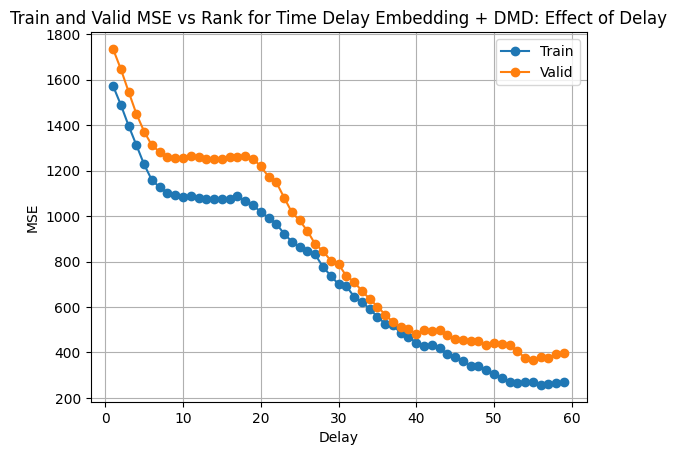

In [46]:
delays = list(train_error_tde2.keys())
train_tde_mse_values = [train_error_tde2[delay]['mse'] for delay in delays]
valid_tde_mse_values = [valid_error_tde2[delay]['mse'] for delay in delays]

# Create the plot
plt.plot(delays, train_tde_mse_values, marker='o', linestyle='-', label='Train')
plt.plot(delays, valid_tde_mse_values, marker='o', linestyle='-', label='Valid')
plt.xlabel('Delay')
plt.ylabel('MSE')
plt.title('Train and Valid MSE vs Rank for Time Delay Embedding + DMD: Effect of Delay')
plt.legend()
plt.grid(True)
plt.show()

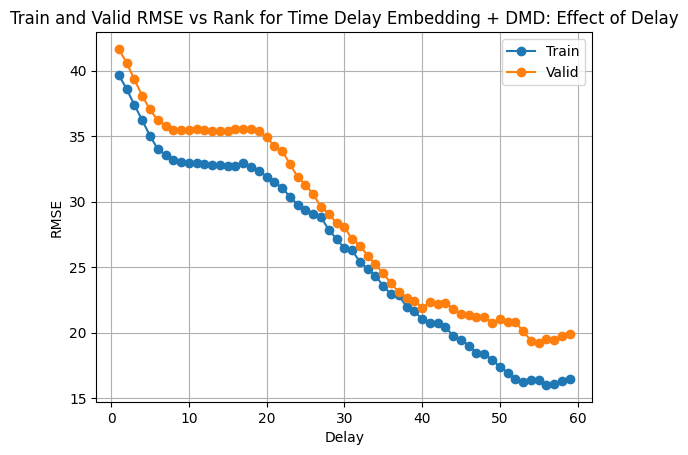

In [47]:
delays = list(train_error_tde2.keys())
train_tde_rmse_values = [train_error_tde2[delay]['rmse'] for delay in delays]
valid_tde_rmse_values = [valid_error_tde2[delay]['rmse'] for delay in delays]

# Create the plot
plt.plot(delays, train_tde_rmse_values, marker='o', linestyle='-', label='Train')
plt.plot(delays, valid_tde_rmse_values, marker='o', linestyle='-', label='Valid')
plt.xlabel('Delay')
plt.ylabel('RMSE')
plt.title('Train and Valid RMSE vs Rank for Time Delay Embedding + DMD: Effect of Delay')
plt.legend()
plt.grid(True)
plt.show()

In [48]:
num_columns = x_tsc_input.shape[1]

min_mse_delay_tde_key = min(valid_error_tde2, key=lambda k: valid_error_tde2[k]['mse'])
min_mse_delay_tde_value = valid_error_tde2[min_mse_delay_tde_key]['mse']

time_delay_embed = TSCTakensEmbedding(delays=min_mse_delay_tde_key, lag=0, frequency=1, kappa=0).fit(x_tsc_input)
embed_values_input_delay = time_delay_embed.transform(x_tsc_input)
embed_values_test_delay = time_delay_embed.transform(x_tsc_test)

x_time_delay_test_init = x_tsc_test.iloc[min_mse_delay_tde_key:]

dmd = models.dmd(embed_values_input_delay)
    
dmd_values_new_test_delay = dmd.predict(embed_values_test_delay.initial_states(), time_values=embed_values_test_delay.time_values())
x_alternate_test_delay = time_delay_embed.inverse_transform(dmd_values_new_test_delay)
test_tde_dmd_mae, test_tde_dmd_mse, test_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_test_init, x_alternate_test_delay)


/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/dynfold/dmd.py:1265: UserWarning: Shift matrix (G.shape=(280, 280)) has not full rank (linregress_model.rank_=271), falling back to least squares solution.
  ) = self._compute_full_system_matrix(X, sample_weights=sample_weights)
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).head(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1666: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a futur

In [49]:
print(f"Time Delay for minimum MSE : {min_mse_delay_tde_key}")
print(f"Minimum MSE value : {min_mse_delay_tde_value}")

print(f"\n")
print('Testing error')
print(f"Testing mae:{test_tde_dmd_mae}")
print(f"Testing mse:{test_tde_dmd_mse}")
print(f"Testing rmse:{test_tde_dmd_rmse}")

Time Delay for minimum MSE : 55
Minimum MSE value : 368.16982237623733


Testing error
Testing mae:6.879074082616233
Testing mse:393.8690772069219
Testing rmse:19.84613506975406


In [51]:
num_columns = x_tsc_input.shape[1]

min_rmse_delay_tde_key = min(valid_error_tde2, key=lambda k: valid_error_tde2[k]['rmse'])
min_rmse_delay_tde_value = valid_error_tde2[min_rmse_delay_tde_key]['rmse']

time_delay_embed = TSCTakensEmbedding(delays=min_rmse_delay_tde_key, lag=0, frequency=1, kappa=0).fit(x_tsc_input)
embed_values_input_delay = time_delay_embed.transform(x_tsc_input)
embed_values_test_delay = time_delay_embed.transform(x_tsc_test)

x_time_delay_test_init = x_tsc_test.iloc[min_rmse_delay_tde_key:]

dmd = models.dmd(embed_values_input_delay)
    
dmd_values_new_test_delay = dmd.predict(embed_values_test_delay.initial_states(), time_values=embed_values_test_delay.time_values())
x_alternate_test_delay = time_delay_embed.inverse_transform(dmd_values_new_test_delay)
test_tde_dmd_mae, test_tde_dmd_mse, test_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_test_init, x_alternate_test_delay)


/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/dynfold/dmd.py:1265: UserWarning: Shift matrix (G.shape=(280, 280)) has not full rank (linregress_model.rank_=271), falling back to least squares solution.
  ) = self._compute_full_system_matrix(X, sample_weights=sample_weights)
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).head(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1666: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a futur

In [52]:
print(f"Time Delay for minimum RMSE : {min_rmse_delay_tde_key}")
print(f"Minimum RMSE value : {min_rmse_delay_tde_value}")

print(f"\n")
print('Testing error')
print(f"Testing mae:{test_tde_dmd_mae}")
print(f"Testing mse:{test_tde_dmd_mse}")
print(f"Testing rmse:{test_tde_dmd_rmse}")

Time Delay for minimum RMSE : 55
Minimum RMSE value : 19.18775188437242


Testing error
Testing mae:6.879074082616233
Testing mse:393.8690772069219
Testing rmse:19.84613506975406


In [85]:
train_error_tde3 = {}
valid_error_tde3 = {}

for delay in range(1,60):
    time_delay_embed = TSCTakensEmbedding(delays=delay, lag=0, frequency=1, kappa=0).fit(x_tsc_train)
    embed_values_train = time_delay_embed.transform(x_tsc_train)
    embed_values_valid = time_delay_embed.transform(x_tsc_valid)
    num_columns = embed_values_train.shape[1]

    x_time_delay_train_tde_init = x_tsc_train.iloc[delay:]
    x_time_delay_valid_tde_init = x_tsc_valid.iloc[delay:]

    train_error_tde3[delay] = {}
    valid_error_tde3[delay] = {}

    for rank in range(1, num_columns +1):
        if rank == num_columns:
            dmd = models.dmd(embed_values_train)
        else:
            dmd = models.dmd(embed_values_train, rank = rank)

        dmd_values_train_tde_new = dmd.predict(embed_values_train.initial_states(), time_values=embed_values_train.time_values())
        x_predicted_dmd_train_tde_new = dmd_values_train_tde_new

        x_alternate_train_tde = time_delay_embed.inverse_transform(dmd_values_train_tde_new)
        train_tde_dmd_mae, train_tde_dmd_mse, train_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_train_tde_init, x_alternate_train_tde)
        train_error_tde3[delay][rank] = {'mae': train_tde_dmd_mae, 'mse' : train_tde_dmd_mse, 'rmse': train_tde_dmd_rmse}
    
        dmd_values_valid_tde_new = dmd.predict(embed_values_valid.initial_states(), time_values=embed_values_valid.time_values())
        x_predicted_dmd_valid_tde_new = dmd_values_valid_tde_new

        x_alternate_valid_tde = time_delay_embed.inverse_transform(dmd_values_valid_tde_new)
        valid_tde_dmd_mae, valid_tde_dmd_mse, valid_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_valid_tde_init, x_alternate_valid_tde)
        valid_error_tde3[delay][rank] = {'mae': valid_tde_dmd_mae, 'mse' : valid_tde_dmd_mse, 'rmse': valid_tde_dmd_rmse}

/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).head(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1666: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).tail(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future v

In [56]:
train_error_tde3

{1: {1: {'mae': 24.44025204645742,
   'mse': 3485.9695477783343,
   'rmse': 59.04209979140592},
  2: {'mae': 32.517837201055514,
   'mse': 3834.285711455067,
   'rmse': 61.921609406208646},
  3: {'mae': 24.08259891659309,
   'mse': 1994.8899757085806,
   'rmse': 44.66419120177349},
  4: {'mae': 21.416945271187153,
   'mse': 1683.5790699646427,
   'rmse': 41.03144001816951},
  5: {'mae': 23.31471831889267,
   'mse': 1635.0523521633345,
   'rmse': 40.43578059297649},
  6: {'mae': 22.867218515187457,
   'mse': 1610.0016545857795,
   'rmse': 40.124825913463845},
  7: {'mae': 22.495871002520982,
   'mse': 1587.3654627818346,
   'rmse': 39.841755267330214},
  8: {'mae': 22.304543379600325,
   'mse': 1579.4219803108608,
   'rmse': 39.74194233188485},
  9: {'mae': 22.339646255879124,
   'mse': 1593.3911684122654,
   'rmse': 39.91730412255148},
  10: {'mae': 21.776285046806994,
   'mse': 1573.2435930132688,
   'rmse': 39.664134845137724}},
 2: {1: {'mae': 24.400758900892615,
   'mse': 3471.0255

In [57]:
valid_error_tde3

{1: {1: {'mae': 24.159990173683532,
   'mse': 3417.718822674736,
   'rmse': 58.46125916087282},
  2: {'mae': 32.36742647701986,
   'mse': 3777.465343622565,
   'rmse': 61.46108804457146},
  3: {'mae': 24.891737843515614,
   'mse': 2129.8241361936402,
   'rmse': 46.15001772690494},
  4: {'mae': 22.437880003482483,
   'mse': 1859.8358818281158,
   'rmse': 43.125814564227255},
  5: {'mae': 24.403913585161085,
   'mse': 1803.5151538369441,
   'rmse': 42.467813151102376},
  6: {'mae': 23.951413178597143,
   'mse': 1774.4101110798442,
   'rmse': 42.12374759063876},
  7: {'mae': 23.57732516289819,
   'mse': 1750.302716038265,
   'rmse': 41.83661931894432},
  8: {'mae': 23.386040788497958,
   'mse': 1742.4088966665652,
   'rmse': 41.742171681245395},
  9: {'mae': 23.4175690465765,
   'mse': 1756.2054505189146,
   'rmse': 41.90710501238322},
  10: {'mae': 22.853112388963364,
   'mse': 1735.848154158124,
   'rmse': 41.66351106373686}},
 2: {1: {'mae': 24.11981042790699,
   'mse': 3403.2301517570

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Extract MSE values into a new dictionary
mse_dict_train = {delay: {rank: train_error_tde3[delay][rank]['mse'] for rank in train_error_tde3[delay]} for delay in train_error_tde3}
mse_dict_valid = {delay: {rank: valid_error_tde3[delay][rank]['mse'] for rank in valid_error_tde3[delay]} for delay in valid_error_tde3}

rmse_dict_train = {delay: {rank: train_error_tde3[delay][rank]['rmse'] for rank in train_error_tde3[delay]} for delay in train_error_tde3}
rmse_dict_valid = {delay: {rank: valid_error_tde3[delay][rank]['rmse'] for rank in valid_error_tde3[delay]} for delay in valid_error_tde3}

# Convert dictionary to DataFrame for plotting
mse_df_train = pd.DataFrame(mse_dict_train).T
mse_df_valid = pd.DataFrame(mse_dict_valid).T

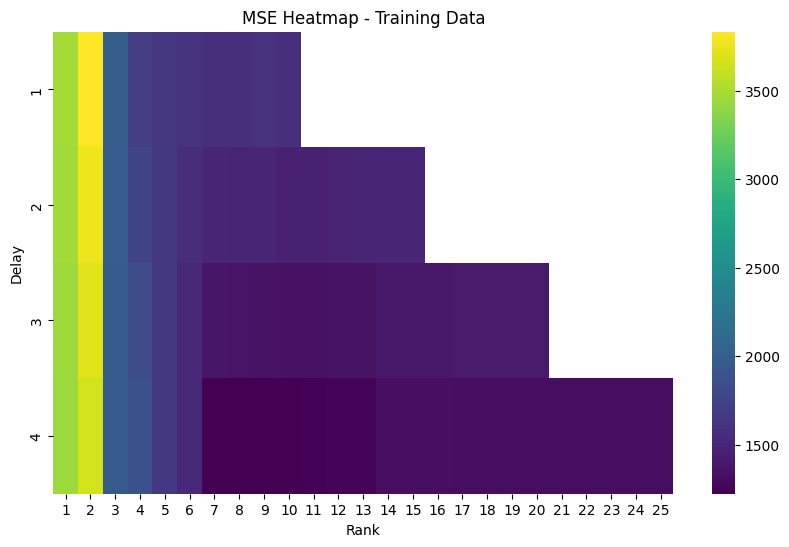

In [61]:
plt.figure(figsize=(10, 6))
sns.heatmap(mse_df_train, annot=False, cmap='viridis', fmt=".2f")
plt.title('MSE Heatmap - Training Data')
plt.xlabel('Rank')
plt.ylabel('Delay')
plt.show()

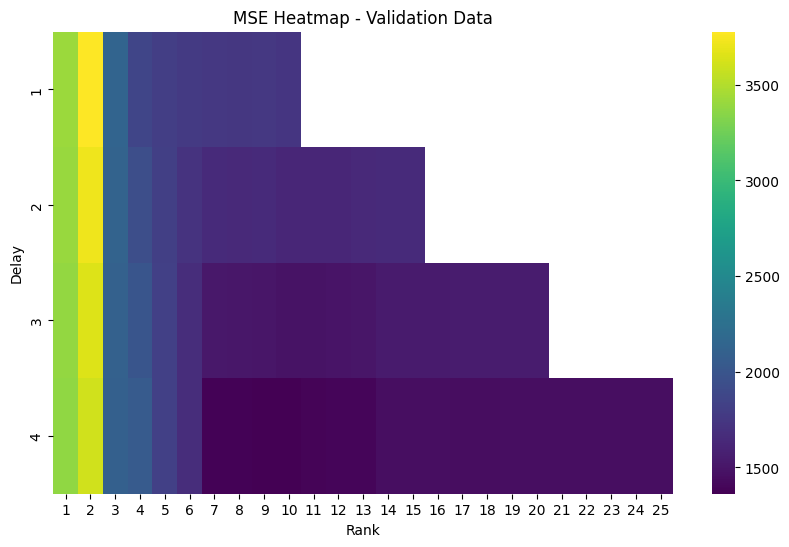

In [62]:
plt.figure(figsize=(10, 6))
sns.heatmap(mse_df_valid, annot=False, cmap='viridis', fmt=".2f")
plt.title('MSE Heatmap - Validation Data')
plt.xlabel('Rank')
plt.ylabel('Delay')
plt.show()

/tmp/ipykernel_82902/2407646735.py:10: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(valid_ranks, valid_mse_values, label=f'Valid Delay {delay}', alpha=0.7, edgecolors='k', marker='x')


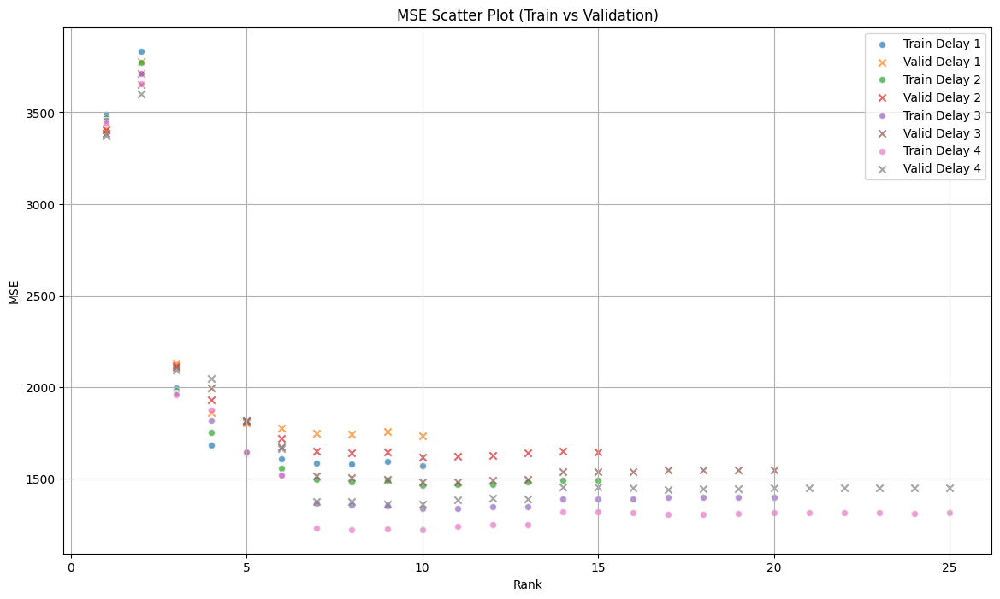

In [63]:
plt.figure(figsize=(14, 8))

for delay in mse_dict_train.keys():
    train_ranks = list(mse_dict_train[delay].keys())
    train_mse_values = list(mse_dict_train[delay].values())
    valid_ranks = list(mse_dict_valid[delay].keys())
    valid_mse_values = list(mse_dict_valid[delay].values())

    plt.scatter(train_ranks, train_mse_values, label=f'Train Delay {delay}', alpha=0.7, edgecolors='w')
    plt.scatter(valid_ranks, valid_mse_values, label=f'Valid Delay {delay}', alpha=0.7, edgecolors='k', marker='x')


plt.title('MSE Scatter Plot (Train vs Validation)')
plt.xlabel('Rank')
plt.ylabel('MSE')
plt.legend()
plt.grid(True)
plt.show()

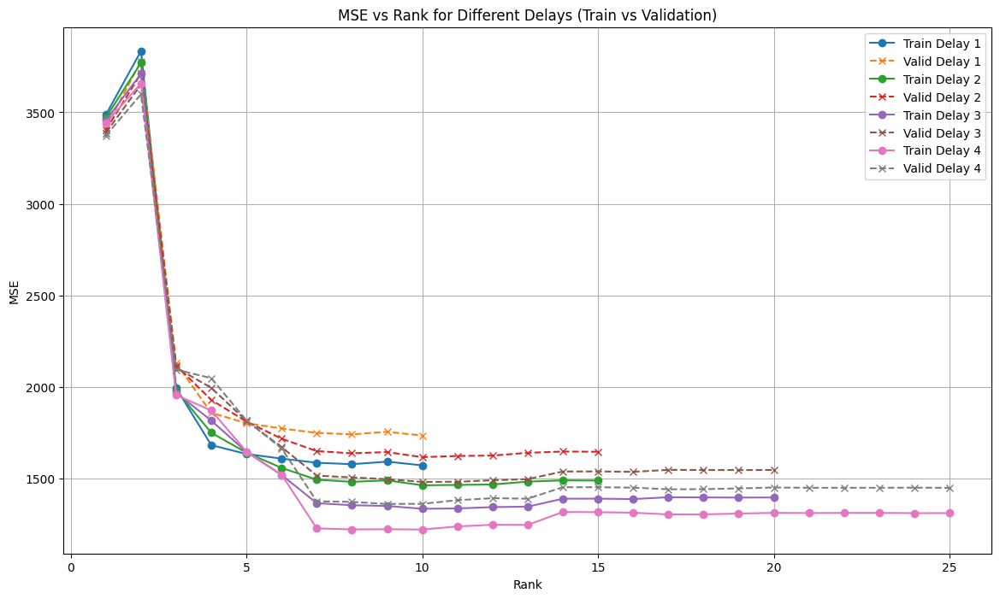

In [64]:
plt.figure(figsize=(14, 8))

for delay in mse_dict_train.keys():
    train_ranks = list(mse_dict_train[delay].keys())
    train_mse_values = list(mse_dict_train[delay].values())
    valid_ranks = list(mse_dict_valid[delay].keys())
    valid_mse_values = list(mse_dict_valid[delay].values())
    
    plt.plot(train_ranks, train_mse_values, marker='o', label=f'Train Delay {delay}', linestyle='-')
    plt.plot(valid_ranks, valid_mse_values, marker='x', label=f'Valid Delay {delay}', linestyle='--')

plt.title('MSE vs Rank for Different Delays (Train vs Validation)')
plt.xlabel('Rank')
plt.ylabel('MSE')
plt.legend()
plt.grid(True)
plt.show()

In [65]:
# Initialize variables to store the minimum MSE values and their corresponding delay and rank
min_train_mse = float('inf')
min_train_delay = None
min_train_rank = None

min_valid_mse = float('inf')
min_valid_delay = None
min_valid_rank = None

# Find the minimum MSE value for training data
for delay, ranks in mse_dict_train.items():
    for rank, mse in ranks.items():
        if mse < min_train_mse:
            min_train_mse = mse
            min_train_delay = delay
            min_train_rank = rank

# Find the minimum MSE value for validation data
for delay, ranks in mse_dict_valid.items():
    for rank, mse in ranks.items():
        if mse < min_valid_mse:
            min_valid_mse = mse
            min_valid_delay = delay
            min_valid_rank = rank

# Print the results
print(f"Minimum Training MSE: {min_train_mse} at Delay {min_train_delay}, Rank {min_train_rank}")
print(f"Minimum Validation MSE: {min_valid_mse} at Delay {min_valid_delay}, Rank {min_valid_rank}")


Minimum Training MSE: 1222.7465360059227 at Delay 4, Rank 10
Minimum Validation MSE: 1362.4623711755996 at Delay 4, Rank 9


In [66]:
# Initialize variables to store the minimum MSE values and their corresponding delay and rank
min_train_rmse = float('inf')
min_train_delay = None
min_train_rank = None

min_valid_rmse = float('inf')
min_valid_delay = None
min_valid_rank = None

# Find the minimum MSE value for training data
for delay, ranks in rmse_dict_train.items():
    for rank, rmse in ranks.items():
        if rmse < min_train_rmse:
            min_train_rmse = rmse
            min_train_delay = delay
            min_train_rank = rank

# Find the minimum MSE value for validation data
for delay, ranks in rmse_dict_valid.items():
    for rank, rmse in ranks.items():
        if rmse < min_valid_rmse:
            min_valid_rmse = rmse
            min_valid_delay = delay
            min_valid_rank = rank

# Print the results
print(f"Minimum Training RMSE: {min_train_rmse} at Delay {min_train_delay}, Rank {min_train_rank}")
print(f"Minimum Validation RMSE: {min_valid_rmse} at Delay {min_valid_delay}, Rank {min_valid_rank}")

Minimum Training RMSE: 34.96779283863828 at Delay 4, Rank 10
Minimum Validation RMSE: 36.91154793795025 at Delay 4, Rank 9


In [67]:
num_columns = x_tsc_input.shape[1]

time_delay_embed = TSCTakensEmbedding(delays=min_valid_delay, lag=0, frequency=1, kappa=0).fit(x_tsc_input)
embed_values_input_delay = time_delay_embed.transform(x_tsc_input)
embed_values_test_delay = time_delay_embed.transform(x_tsc_test)

x_time_delay_test_init = x_tsc_test.iloc[min_mse_delay_tde_key:]

dmd = models.dmd(embed_values_input_delay, rank = min_valid_rank)
    
dmd_values_new_test_delay = dmd.predict(embed_values_test_delay.initial_states(), time_values=embed_values_test_delay.time_values())
x_alternate_test_delay = time_delay_embed.inverse_transform(dmd_values_new_test_delay)
test_tde_dmd_mae, test_tde_dmd_mse, test_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_test_init, x_alternate_test_delay)


/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).head(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1666: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).tail(


In [68]:
print('Testing error')
print(f"Testing mae:{test_tde_dmd_mae}")
print(f"Testing mse:{test_tde_dmd_mse}")
print(f"Testing rmse:{test_tde_dmd_rmse}")

Testing error
Testing mae:12.803495873880006
Testing mse:741.8645057942425
Testing rmse:27.23718975581443


In [69]:
last_column_df

measurement_area6
id timeStep                   
0  1                       968
   2                       968
   3                       986
   4                       990
   5                       990
...                        ...
29 1247                      0
   1248                      0
   1249                      0
   1250                      0
   1251                      0

[37530 rows x 1 columns]

In [74]:
def find_first_zero(df):
    result = {}
    for id_val in df.index.get_level_values('id').unique():
        # Get the sub-DataFrame for the current id
        sub_df = df.loc[id_val]
        # Find the first occurrence of 0
        first_zero_timestep = sub_df[sub_df['measurement_area6'] == 0].index.min()
        result[id_val] = first_zero_timestep
    return result

In [71]:
data_final

measurement_area1  measurement_area2  measurement_area3  \
id timeStep                                                            
0  1                     242.0              231.0                0.0   
   2                     242.0              231.0                0.0   
   3                     246.0              241.0                0.0   
   4                     238.0              248.0                0.0   
   5                     233.0              247.0                0.0   
...                        ...                ...                ...   
29 1247                    0.0                0.0                0.0   
   1248                    0.0                0.0                0.0   
   1249                    0.0                0.0                0.0   
   1250                    0.0                0.0                0.0   
   1251                    0.0                0.0                0.0   

             measurement_area4  measurement_area5  
id timeStep                                        
0  1                       0.0                0.0  
   2                       0.0                0.0  
   3                       0.0                0.0  
   4                       0.0                0.0  
   5                       0.0                0.0  
...                        ...                ...  
29 1247                    0.0                0.0  
   1248                    0.0                0.0  
   1249                    0.0                0.0  
   1250                    0.0                0.0  
   1251                    0.0                0.0  

[37530 rows x 5 columns]

In [72]:
sums = data_final.sum(axis=1)

# Find the timestep where the sum is zero or minimum for each id
results = sums.groupby('id').idxmin()

# If you need the minimum values as well
min_values = sums.groupby('id').min()

# Display the results
print("Timestep at which the sum of entries of all columns is minimum or zero for each id:")
print(results)

Timestep at which the sum of entries of all columns is minimum or zero for each id:
id
0      (0, 396)
1      (1, 394)
2      (2, 433)
3      (3, 445)
4      (4, 492)
5      (5, 480)
6      (6, 544)
7      (7, 543)
8      (8, 383)
9      (9, 401)
10    (10, 347)
11    (11, 442)
12    (12, 438)
13    (13, 494)
14    (14, 490)
15    (15, 384)
16    (16, 399)
17    (17, 334)
18    (18, 353)
19    (19, 452)
20    (20, 444)
21    (21, 334)
22    (22, 354)
23    (23, 309)
24    (24, 402)
25    (25, 394)
26    (26, 329)
27    (27, 329)
28    (28, 336)
29    (29, 359)
dtype: object


In [75]:
first_zero_timesteps = find_first_zero(last_column_df)
first_zero_timesteps

{0: 396,
 1: 394,
 2: 435,
 3: 445,
 4: 492,
 5: 480,
 6: 545,
 7: 543,
 8: 383,
 9: 401,
 10: 347,
 11: 442,
 12: 438,
 13: 494,
 14: 490,
 15: 384,
 16: 399,
 17: 334,
 18: 355,
 19: 452,
 20: 444,
 21: 334,
 22: 354,
 23: 309,
 24: 402,
 25: 394,
 26: 329,
 27: 329,
 28: 336,
 29: 359}

In [82]:
x_time_delay_train_tde_init[x_time_delay_train_tde_init<1]=0
x_time_delay_valid_tde_init[x_time_delay_valid_tde_init<1]=0
x_alternate_train_tde[x_alternate_train_tde<1]=0
x_alternate_valid_tde[x_alternate_valid_tde<1] =0
x_alternate_valid_tde

/tmp/ipykernel_82902/2171816496.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_time_delay_train_tde_init[x_time_delay_train_tde_init<1]=0
/tmp/ipykernel_82902/2171816496.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_time_delay_train_tde_init[x_time_delay_train_tde_init<1]=0
/tmp/ipykernel_82902/2171816496.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

feature  measurement_area1  measurement_area2  measurement_area3  \
ID time                                                            
0  5            241.000000         233.000000                0.0   
   6            235.811779         233.826141                0.0   
   7            228.267925         236.164638                0.0   
   8            219.601953         238.104147                0.0   
   9            210.210016         238.735146                0.0   
...                    ...                ...                ...   
13 1247           0.000000           0.000000                0.0   
   1248           0.000000           0.000000                0.0   
   1249           0.000000           0.000000                0.0   
   1250           0.000000           0.000000                0.0   
   1251           0.000000           0.000000                0.0   

feature  measurement_area4  measurement_area5  
ID time                                        
0  5                   0.0                0.0  
   6                   0.0                0.0  
   7                   0.0                0.0  
   8                   0.0                0.0  
   9                   0.0                0.0  
...                    ...                ...  
13 1247                0.0                0.0  
   1248                0.0                0.0  
   1249                0.0                0.0  
   1250                0.0                0.0  
   1251                0.0                0.0  

[17458 rows x 5 columns]

In [83]:
sums_train_init = x_time_delay_train_tde_init.sum(axis=1)
sums_train_predict =x_alternate_train_tde.sum(axis=1)

# Find the timestep where the sum is zero or minimum for each id
results_train_init = sums_train_init.groupby('ID').idxmin()
results_train_predict = sums_train_predict.groupby('ID').idxmin()

# If you need the minimum values as well
min_values_train_init = sums_train_init.groupby('ID').min()
min_values_train_predict = sums_train_predict.groupby('ID').min()

# Display the results
print("Timestep at which the sum of entries of all columns is minimum or zero for each id:")
print(results_train_init)
print("Timestep at which the sum of entries of all columns is minimum or zero for each id:")
print(results_train_predict)

Timestep at which the sum of entries of all columns is minimum or zero for each id:
ID
0      (0, 430)
1      (1, 436)
2      (2, 389)
3      (3, 295)
4      (4, 377)
5      (5, 539)
6      (6, 394)
7      (7, 482)
8      (8, 329)
9      (9, 324)
10    (10, 426)
11    (11, 343)
12    (12, 486)
13    (13, 383)
dtype: object
Timestep at which the sum of entries of all columns is minimum or zero for each id:
ID
0      (0, 1074)
1      (1, 1048)
2      (2, 1045)
3      (3, 1035)
4      (4, 1048)
5      (5, 1058)
6      (6, 1073)
7      (7, 1051)
8      (8, 1029)
9      (9, 1127)
10    (10, 1058)
11    (11, 1067)
12    (12, 1071)
13    (13, 1032)
dtype: object


In [84]:
sums_valid_init = x_time_delay_valid_tde_init.sum(axis=1)
sums_valid_predict =x_alternate_valid_tde.sum(axis=1)

# Find the timestep where the sum is zero or minimum for each id
results_valid_init = sums_valid_init.groupby('ID').idxmin()
results_valid_predict = sums_valid_predict.groupby('ID').idxmin()

# If you need the minimum values as well
min_values_valid_init = sums_valid_init.groupby('ID').min()
min_values_valid_predict = sums_valid_predict.groupby('ID').min()

# Display the results
print("Timestep at which the sum of entries of all columns is minimum or zero for each id:")
print(results_valid_init)
print("Timestep at which the sum of entries of all columns is minimum or zero for each id:")
print(results_valid_predict)

Timestep at which the sum of entries of all columns is minimum or zero for each id:
ID
0      (0, 476)
1      (1, 539)
2      (2, 340)
3      (3, 322)
4      (4, 386)
5      (5, 442)
6      (6, 348)
7      (7, 343)
8      (8, 381)
9      (9, 424)
10    (10, 478)
11    (11, 435)
12    (12, 378)
13    (13, 323)
dtype: object
Timestep at which the sum of entries of all columns is minimum or zero for each id:
ID
0      (0, 1037)
1      (1, 1056)
2      (2, 1032)
3      (3, 1070)
4      (4, 1070)
5      (5, 1056)
6      (6, 1031)
7      (7, 1028)
8      (8, 1044)
9      (9, 1057)
10    (10, 1057)
11    (11, 1038)
12    (12, 1050)
13    (13, 1088)
dtype: object


In [94]:
import itertools
import errors
# Lists of parameter values
delay_values = [10,20,30,40,50,60,70,80,90]
lag_values = [0]
frequency_values = [1]

# Generate all combinations of parameters
parameter_combinations = list(itertools.product(delay_values, lag_values, frequency_values))

train_error_tde2 = {}
valid_error_tde2 = {}

for delay, lag, frequency in parameter_combinations:
    time_delay_embed = TSCTakensEmbedding(delays=delay, lag=lag, frequency=frequency, kappa=0).fit(x_tsc_train)
    embed_values_train = time_delay_embed.transform(x_tsc_train)
    embed_values_valid = time_delay_embed.transform(x_tsc_valid)
    num_columns = embed_values_train.shape[1]

    x_time_delay_train_tde_init = x_tsc_train.iloc[delay:]
    x_time_delay_valid_tde_init = x_tsc_valid.iloc[delay:]

    dmd = models.dmd(embed_values_train)
    dmd_values_train_tde_new = dmd.predict(embed_values_train.initial_states(), time_values=embed_values_train.time_values())
    x_predicted_dmd_train_tde_new = dmd_values_train_tde_new

    x_alternate_train_tde = time_delay_embed.inverse_transform(dmd_values_train_tde_new)
    train_tde_dmd_mae, train_tde_dmd_mse, train_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_train_tde_init, x_alternate_train_tde)
    train_error_tde2[(delay, lag, frequency)] = {'mae': train_tde_dmd_mae, 'mse' : train_tde_dmd_mse, 'rmse': train_tde_dmd_rmse}

    dmd_values_valid_tde_new = dmd.predict(embed_values_valid.initial_states(), time_values=embed_values_valid.time_values())
    x_predicted_dmd_valid_tde_new = dmd_values_valid_tde_new

    x_alternate_valid_tde = time_delay_embed.inverse_transform(dmd_values_valid_tde_new)
    valid_tde_dmd_mae, valid_tde_dmd_mse, valid_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_valid_tde_init, x_alternate_valid_tde)
    valid_error_tde2[(delay, lag, frequency)] = {'mae': valid_tde_dmd_mae, 'mse' : valid_tde_dmd_mse, 'rmse': valid_tde_dmd_rmse}

/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).head(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1666: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).tail(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future v

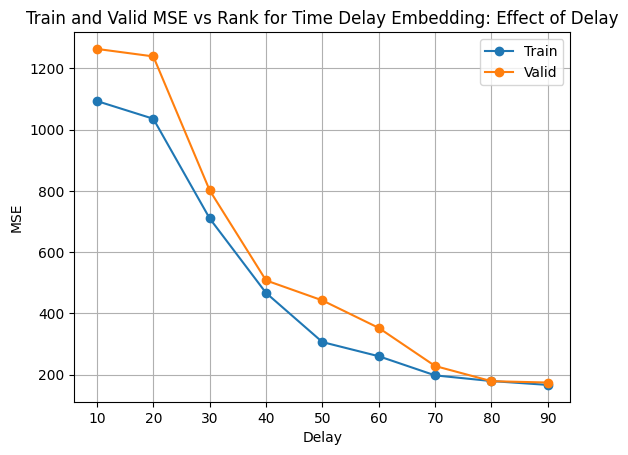

In [95]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


# Extract parameters and MSE values
delays = []
lags = []
frequencies = []
train_mse_values = []
valid_mse_values = []

for (delay, lag, frequency), errors in train_error_tde2.items():
    delays.append(delay)
    train_mse_values.append(errors['mse'])

for (delay, lag, frequency), errors in valid_error_tde2.items():
    valid_mse_values.append(errors['mse'])

# Create the plot
plt.plot(delays, train_mse_values, marker='o', linestyle='-', label='Train')
plt.plot(delays, valid_mse_values, marker='o', linestyle='-', label='Valid')
plt.xlabel('Delay')
plt.ylabel('MSE')
plt.title('Train and Valid MSE vs Rank for Time Delay Embedding: Effect of Delay')
plt.legend()
plt.grid(True)
plt.show()

In [96]:
import itertools
import errors
# Lists of parameter values
delay_values = [70]
lag_values = [0,2,4,6,10,12,14,16]
frequency_values = [1]

# Generate all combinations of parameters
parameter_combinations = list(itertools.product(delay_values, lag_values, frequency_values))

train_error_tde2 = {}
valid_error_tde2 = {}

for delay, lag, frequency in parameter_combinations:
    time_delay_embed = TSCTakensEmbedding(delays=delay, lag=lag, frequency=frequency, kappa=0).fit(x_tsc_train)
    embed_values_train = time_delay_embed.transform(x_tsc_train)
    embed_values_valid = time_delay_embed.transform(x_tsc_valid)
    num_columns = embed_values_train.shape[1]

    x_time_delay_train_tde_init = x_tsc_train.iloc[delay:]
    x_time_delay_valid_tde_init = x_tsc_valid.iloc[delay:]

    dmd = models.dmd(embed_values_train)
    dmd_values_train_tde_new = dmd.predict(embed_values_train.initial_states(), time_values=embed_values_train.time_values())
    x_predicted_dmd_train_tde_new = dmd_values_train_tde_new

    x_alternate_train_tde = time_delay_embed.inverse_transform(dmd_values_train_tde_new)
    train_tde_dmd_mae, train_tde_dmd_mse, train_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_train_tde_init, x_alternate_train_tde)
    train_error_tde2[(delay, lag, frequency)] = {'mae': train_tde_dmd_mae, 'mse' : train_tde_dmd_mse, 'rmse': train_tde_dmd_rmse}

    dmd_values_valid_tde_new = dmd.predict(embed_values_valid.initial_states(), time_values=embed_values_valid.time_values())
    x_predicted_dmd_valid_tde_new = dmd_values_valid_tde_new

    x_alternate_valid_tde = time_delay_embed.inverse_transform(dmd_values_valid_tde_new)
    valid_tde_dmd_mae, valid_tde_dmd_mse, valid_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_valid_tde_init, x_alternate_valid_tde)
    valid_error_tde2[(delay, lag, frequency)] = {'mae': valid_tde_dmd_mae, 'mse' : valid_tde_dmd_mse, 'rmse': valid_tde_dmd_rmse}

/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/dynfold/dmd.py:1265: UserWarning: Shift matrix (G.shape=(355, 355)) has not full rank (linregress_model.rank_=322), falling back to least squares solution.
  ) = self._compute_full_system_matrix(X, sample_weights=sample_weights)
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).head(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1666: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a futur

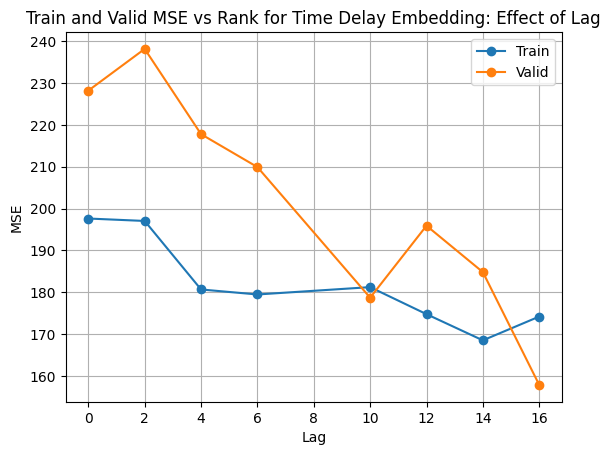

In [97]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


# Extract parameters and MSE values
delays = []
lags = []
frequencies = []
train_mse_values = []
valid_mse_values = []

for (delay, lag, frequency), errors in train_error_tde2.items():
    lags.append(lag)
    train_mse_values.append(errors['mse'])

for (delay, lag, frequency), errors in valid_error_tde2.items():
    valid_mse_values.append(errors['mse'])

# Create the plot
plt.plot(lags, train_mse_values, marker='o', linestyle='-', label='Train')
plt.plot(lags, valid_mse_values, marker='o', linestyle='-', label='Valid')
plt.xlabel('Lag')
plt.ylabel('MSE')
plt.title('Train and Valid MSE vs Rank for Time Delay Embedding: Effect of Lag')
plt.legend()
plt.grid(True)
plt.show()

In [114]:
import itertools
import errors
# Lists of parameter values
delay_values = [25]
lag_values = [2,3,4]
frequency_values = [1]

# Generate all combinations of parameters
parameter_combinations = list(itertools.product(delay_values, lag_values, frequency_values))

train_error_tde2 = {}
valid_error_tde2 = {}

for delay, lag, frequency in parameter_combinations:
    time_delay_embed = TSCTakensEmbedding(delays=delay, lag=lag, frequency=frequency, kappa=0).fit(x_tsc_train)
    embed_values_train = time_delay_embed.transform(x_tsc_train)
    embed_values_valid = time_delay_embed.transform(x_tsc_valid)
    num_columns = embed_values_train.shape[1]

    x_time_delay_train_tde_init = x_tsc_train.iloc[delay:]
    x_time_delay_valid_tde_init = x_tsc_valid.iloc[delay:]

    dmd = models.dmd(embed_values_train)
    dmd_values_train_tde_new = dmd.predict(embed_values_train.initial_states(), time_values=embed_values_train.time_values())
    x_predicted_dmd_train_tde_new = dmd_values_train_tde_new

    x_alternate_train_tde = time_delay_embed.inverse_transform(dmd_values_train_tde_new)
    train_tde_dmd_mae, train_tde_dmd_mse, train_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_train_tde_init, x_alternate_train_tde)
    train_error_tde2[(delay, lag, frequency)] = {'mae': train_tde_dmd_mae, 'mse' : train_tde_dmd_mse, 'rmse': train_tde_dmd_rmse}

    dmd_values_valid_tde_new = dmd.predict(embed_values_valid.initial_states(), time_values=embed_values_valid.time_values())
    x_predicted_dmd_valid_tde_new = dmd_values_valid_tde_new

    x_alternate_valid_tde = time_delay_embed.inverse_transform(dmd_values_valid_tde_new)
    valid_tde_dmd_mae, valid_tde_dmd_mse, valid_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_valid_tde_init, x_alternate_valid_tde)
    valid_error_tde2[(delay, lag, frequency)] = {'mae': valid_tde_dmd_mae, 'mse' : valid_tde_dmd_mse, 'rmse': valid_tde_dmd_rmse}

/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).head(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1666: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).tail(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future v

In [115]:
x_alternate_valid_tde

feature  measurement_area1  measurement_area2  measurement_area3  \
ID time                                                            
0  30            14.000000         265.000000      -4.598988e-12   
   31            10.720955         265.035524      -1.422037e-02   
   32             7.071783         266.642552      -2.202790e-01   
   33             4.616838         267.303179      -8.368370e-01   
   34             2.687877         269.033116      -9.818263e-01   
...                    ...                ...                ...   
13 1247           0.000004           0.005099      -1.009999e-01   
   1248           0.000004           0.005072      -1.012538e-01   
   1249           0.000004           0.005045      -1.014965e-01   
   1250           0.000004           0.005018      -1.017281e-01   
   1251           0.000004           0.004991      -1.019486e-01   

feature  measurement_area4  measurement_area5  
ID time                                        
0  30            11.000000          26.000000  
   31            12.000999          28.321092  
   32            13.047462          30.497777  
   33            14.871500          32.915932  
   34            17.324782          35.408575  
...                    ...                ...  
13 1247           0.440751          -0.281229  
   1248           0.452500          -0.290919  
   1249           0.464154          -0.300536  
   1250           0.475712          -0.310079  
   1251           0.487173          -0.319548  

[17108 rows x 5 columns]

In [116]:
valid_error_tde2

{(25, 2, 1): {'mae': 10.730711896660617,
  'mse': 891.9742593405132,
  'rmse': 29.86593811251395},
 (25, 3, 1): {'mae': 10.550492438230297,
  'mse': 887.560153567211,
  'rmse': 29.791947797470563},
 (25, 4, 1): {'mae': 10.405104084183563,
  'mse': 845.7219761337294,
  'rmse': 29.081299423061022}}

In [117]:
import itertools
import errors
# Lists of parameter values
delay_values = [25]
lag_values = [2,3,4]
frequency_values = [1]

# Generate all combinations of parameters
parameter_combinations = list(itertools.product(delay_values, lag_values, frequency_values))

train_error_tde2 = {}
valid_error_tde2 = {}

for delay, lag, frequency in parameter_combinations:
    time_delay_embed = TSCTakensEmbedding(delays=delay, lag=lag, frequency=frequency, kappa=0).fit(x_tsc_train)
    embed_values_train = time_delay_embed.transform(x_tsc_train)
    embed_values_valid = time_delay_embed.transform(x_tsc_valid)
    num_columns = embed_values_train.shape[1]

    x_time_delay_train_tde_init = x_tsc_train.iloc[delay:]
    x_time_delay_valid_tde_init = x_tsc_valid.iloc[delay:]

    dmd = models.dmd(embed_values_train)
    dmd_values_train_tde_new = dmd.predict(embed_values_train.initial_states(), time_values=embed_values_train.time_values())
    x_predicted_dmd_train_tde_new = dmd_values_train_tde_new

    x_alternate_train_tde = time_delay_embed.inverse_transform(dmd_values_train_tde_new)
    train_tde_dmd_mae, train_tde_dmd_mse, train_tde_dmd_rmse,_,_ = errors.compiled_errors(embed_values_train, dmd_values_train_tde_new)
    train_error_tde2[(delay, lag, frequency)] = {'mae': train_tde_dmd_mae, 'mse' : train_tde_dmd_mse, 'rmse': train_tde_dmd_rmse}

    dmd_values_valid_tde_new = dmd.predict(embed_values_valid.initial_states(), time_values=embed_values_valid.time_values())
    x_predicted_dmd_valid_tde_new = dmd_values_valid_tde_new

    x_alternate_valid_tde = time_delay_embed.inverse_transform(dmd_values_valid_tde_new)
    valid_tde_dmd_mae, valid_tde_dmd_mse, valid_tde_dmd_rmse,_,_ = errors.compiled_errors(embed_values_valid, dmd_values_valid_tde_new)
    valid_error_tde2[(delay, lag, frequency)] = {'mae': valid_tde_dmd_mae, 'mse' : valid_tde_dmd_mse, 'rmse': valid_tde_dmd_rmse}

/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).head(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1666: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).tail(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future v

In [118]:
dmd_values_valid_tde_new

feature  measurement_area1  measurement_area2  measurement_area3  \
ID time                                                            
0  30            14.000000         265.000000      -4.598988e-12   
   31            10.720955         265.035524      -1.422037e-02   
   32             7.071783         266.642552      -2.202790e-01   
   33             4.616838         267.303179      -8.368370e-01   
   34             2.687877         269.033116      -9.818263e-01   
...                    ...                ...                ...   
13 1247           0.000004           0.005099      -1.009999e-01   
   1248           0.000004           0.005072      -1.012538e-01   
   1249           0.000004           0.005045      -1.014965e-01   
   1250           0.000004           0.005018      -1.017281e-01   
   1251           0.000004           0.004991      -1.019486e-01   

feature  measurement_area4  measurement_area5  measurement_area1:d5  \
ID time                                                               
0  30            11.000000          26.000000             54.000000   
   31            12.000999          28.321092             44.337985   
   32            13.047462          30.497777             36.782562   
   33            14.871500          32.915932             29.780001   
   34            17.324782          35.408575             23.251099   
...                    ...                ...                   ...   
13 1247           0.440751          -0.281229              0.000007   
   1248           0.452500          -0.290919              0.000007   
   1249           0.464154          -0.300536              0.000007   
   1250           0.475712          -0.310079              0.000007   
   1251           0.487173          -0.319548              0.000007   

feature  measurement_area2:d5  measurement_area3:d5  measurement_area4:d5  \
ID time                                                                     
0  30              264.000000          1.345341e-12         -4.066192e-12   
   31              262.616948         -1.707824e-01          3.665458e+00   
   32              264.642329         -2.054513e-02          4.664135e+00   
   33              265.266482          3.479577e-02          6.369610e+00   
   34              264.079639         -1.452598e-01          7.869440e+00   
...                       ...                   ...                   ...   
13 1247              0.005321         -9.955985e-02          3.806365e-01   
   1248              0.005295         -9.987164e-02          3.928572e-01   
   1249              0.005269         -1.001719e-01          4.049845e-01   
   1250              0.005242         -1.004607e-01          4.170180e-01   
   1251              0.005215         -1.007382e-01          4.289572e-01   

feature  measurement_area5:d5  ...  measurement_area1:d28  \
ID time                        ...                          
0  30               13.000000  ...             247.000000   
   31               16.265995  ...             249.000000   
   32               18.498431  ...             248.000000   
   33               20.690280  ...             241.000000   
   34               22.638511  ...             233.000000   
...                       ...  ...                    ...   
13 1247             -0.231935  ...               0.000007   
   1248             -0.241984  ...               0.000007   
   1249             -0.251961  ...               0.000007   
   1250             -0.261867  ...               0.000007   
   1251             -0.271700  ...               0.000007   

feature  measurement_area2:d28  measurement_area3:d28  measurement_area4:d28  \
ID time                                                                        
0  30               224.000000           8.899548e-13           2.413181e-12   
   31               224.000000          -4.783729e-12           2.862279e-10   
   32               233.000000           1.476037e-10           1.962475e-0

In [119]:
valid_error_tde2

{(25, 2, 1): {'mae': 10.725891524422307,
  'mse': 891.9635688701055,
  'rmse': 29.865759137683167},
 (25, 3, 1): {'mae': 10.548669869847904,
  'mse': 887.5625770549358,
  'rmse': 29.791988470978833},
 (25, 4, 1): {'mae': 10.405041647342216,
  'mse': 845.7356461561353,
  'rmse': 29.081534453259774}}

In [123]:
import itertools
import errors
# Lists of parameter values
delay_values = [20,30,40]
lag_values = [3]
frequency_values = [1,10,20]

# Generate all combinations of parameters
parameter_combinations = list(itertools.product(delay_values, lag_values, frequency_values))

train_error_tde2 = {}
valid_error_tde2 = {}

for delay, lag, frequency in parameter_combinations:
    time_delay_embed = TSCTakensEmbedding(delays=delay, lag=lag, frequency=frequency, kappa=0).fit(x_tsc_train)
    embed_values_train = time_delay_embed.transform(x_tsc_train)
    embed_values_valid = time_delay_embed.transform(x_tsc_valid)
    num_columns = embed_values_train.shape[1]

    x_time_delay_train_tde_init = x_tsc_train.iloc[delay:]
    x_time_delay_valid_tde_init = x_tsc_valid.iloc[delay:]

    dmd = models.dmd(embed_values_train)
    dmd_values_train_tde_new = dmd.predict(embed_values_train.initial_states(), time_values=embed_values_train.time_values())
    x_predicted_dmd_train_tde_new = dmd_values_train_tde_new

    x_alternate_train_tde = time_delay_embed.inverse_transform(dmd_values_train_tde_new)
    train_tde_dmd_mae, train_tde_dmd_mse, train_tde_dmd_rmse,_,_ = errors.compiled_errors(embed_values_train, dmd_values_train_tde_new)
    train_error_tde2[(delay, lag, frequency)] = {'mae': train_tde_dmd_mae, 'mse' : train_tde_dmd_mse, 'rmse': train_tde_dmd_rmse}

    dmd_values_valid_tde_new = dmd.predict(embed_values_valid.initial_states(), time_values=embed_values_valid.time_values())
    x_predicted_dmd_valid_tde_new = dmd_values_valid_tde_new

    x_alternate_valid_tde = time_delay_embed.inverse_transform(dmd_values_valid_tde_new)
    valid_tde_dmd_mae, valid_tde_dmd_mse, valid_tde_dmd_rmse,_,_ = errors.compiled_errors(embed_values_valid, dmd_values_valid_tde_new)
    valid_error_tde2[(delay, lag, frequency)] = {'mae': valid_tde_dmd_mae, 'mse' : valid_tde_dmd_mse, 'rmse': valid_tde_dmd_rmse}

/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).head(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1666: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).tail(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future v

In [124]:
dmd_values_valid_tde_new

feature  measurement_area1  measurement_area2  measurement_area3  \
ID time                                                            
0  785        2.327181e-11      -8.410692e-12       1.658529e-11   
   786        0.000000e+00       0.000000e+00       0.000000e+00   
   787        0.000000e+00       0.000000e+00       0.000000e+00   
   788        0.000000e+00       0.000000e+00       0.000000e+00   
   789        0.000000e+00       0.000000e+00       0.000000e+00   
...                    ...                ...                ...   
13 1247       0.000000e+00       0.000000e+00       0.000000e+00   
   1248       0.000000e+00       0.000000e+00       0.000000e+00   
   1249       0.000000e+00       0.000000e+00       0.000000e+00   
   1250       0.000000e+00       0.000000e+00       0.000000e+00   
   1251       0.000000e+00       0.000000e+00       0.000000e+00   

feature  measurement_area4  measurement_area5  measurement_area1:d4  \
ID time                                                               
0  785        4.535709e-12      -9.816745e-14         -1.838784e-12   
   786        0.000000e+00       0.000000e+00          0.000000e+00   
   787        0.000000e+00       0.000000e+00          0.000000e+00   
   788        0.000000e+00       0.000000e+00          0.000000e+00   
   789        0.000000e+00       0.000000e+00          0.000000e+00   
...                    ...                ...                   ...   
13 1247       0.000000e+00       0.000000e+00          0.000000e+00   
   1248       0.000000e+00       0.000000e+00          0.000000e+00   
   1249       0.000000e+00       0.000000e+00          0.000000e+00   
   1250       0.000000e+00       0.000000e+00          0.000000e+00   
   1251       0.000000e+00       0.000000e+00          0.000000e+00   

feature  measurement_area2:d4  measurement_area3:d4  measurement_area4:d4  \
ID time                                                                     
0  785          -2.626860e-12          5.352422e-12          1.345315e-12   
   786           0.000000e+00          0.000000e+00          0.000000e+00   
   787           0.000000e+00          0.000000e+00          0.000000e+00   
   788           0.000000e+00          0.000000e+00          0.000000e+00   
   789           0.000000e+00          0.000000e+00          0.000000e+00   
...                       ...                   ...                   ...   
13 1247          0.000000e+00          0.000000e+00          0.000000e+00   
   1248          0.000000e+00          0.000000e+00          0.000000e+00   
   1249          0.000000e+00          0.000000e+00          0.000000e+00   
   1250          0.000000e+00          0.000000e+00          0.000000e+00   
   1251          0.000000e+00          0.000000e+00          0.000000e+00   

feature  measurement_area5:d4  ...  measurement_area1:d764  \
ID time                        ...                           
0  785           6.589098e-12  ...               91.000000   
   786           0.000000e+00  ...               79.748967   
   787           0.000000e+00  ...               69.341789   
   788           0.000000e+00  ...               59.796808   
   789           0.000000e+00  ...               51.110497   
...                       ...  ...                     ...   
13 1247          0.000000e+00  ...                0.000323   
   1248          0.000000e+00  ...                0.000356   
   1249          0.000000e+00  ...                0.000387   
   1250          0.000000e+00  ...                0.000416   
   1251          0.000000e+00  ...                0.000443   

feature  measurement_area2:d764  measurement_area3:d764  \
ID time                                                   
0  785               262.000000           -2.273737e-12   
   786               263.196187           -5.789957e-01   
   787               263.969146           -7.187709e-01   
   788               264.435372           -5.683936e-01   
   789               264.701

In [125]:
valid_error_tde2

{(20, 3, 1): {'mae': 11.233055574230386,
  'mse': 1057.6391290528065,
  'rmse': 32.52136419421557},
 (20, 3, 10): {'mae': 1.51488134349839,
  'mse': 20.942253421018556,
  'rmse': 4.576270689220488},
 (20, 3, 20): {'mae': 0.5780565763634362,
  'mse': 4.0915804123550075,
  'rmse': 2.0227655356849956},
 (30, 3, 1): {'mae': 10.067392147141126,
  'mse': 701.8238881654495,
  'rmse': 26.49195893408884},
 (30, 3, 10): {'mae': 0.9335147953908987,
  'mse': 12.049656839200273,
  'rmse': 3.4712615630632433},
 (30, 3, 20): {'mae': 0.41107363354372517,
  'mse': 2.6164891045192347,
  'rmse': 1.617556522820527},
 (40, 3, 1): {'mae': 8.726407633368172,
  'mse': 499.102345735796,
  'rmse': 22.340598598421575},
 (40, 3, 10): {'mae': 0.4864797233296655,
  'mse': 3.3932979718358554,
  'rmse': 1.8420906524478797},
 (40, 3, 20): {'mae': 0.43531892750932516,
  'mse': 2.80804988822563,
  'rmse': 1.6757236908946624}}

In [126]:
# Initialize variables to track minimum MSE and corresponding parameters
min_mse = float('inf')
min_params = None

# Iterate through the dictionary to find the minimum MSE and its parameters
for params, errors in valid_error_tde2.items():
    mse = errors['mse']
    if mse < min_mse:
        min_mse = mse
        min_params = params

print(min_mse)
print(min_params)

2.6164891045192347
(30, 3, 20)


In [ ]:
import itertools
import errors
# Lists of parameter values
delay_values = [30]
lag_values = [3]
frequency_values = [20]

# Generate all combinations of parameters
parameter_combinations = list(itertools.product(delay_values, lag_values, frequency_values))

train_error_tde2 = {}
valid_error_tde2 = {}

for delay, lag, frequency in parameter_combinations:
    time_delay_embed = TSCTakensEmbedding(delays=delay, lag=lag, frequency=frequency, kappa=0).fit(x_tsc_train)
    embed_values_train = time_delay_embed.transform(x_tsc_train)
    embed_values_valid = time_delay_embed.transform(x_tsc_valid)
    num_columns = embed_values_train.shape[1]

    x_time_delay_train_tde_init = x_tsc_train.iloc[delay:]
    x_time_delay_valid_tde_init = x_tsc_valid.iloc[delay:]

    dmd = models.dmd(embed_values_train)
    dmd_values_train_tde_new = dmd.predict(embed_values_train.initial_states(), time_values=embed_values_train.time_values())
    x_predicted_dmd_train_tde_new = dmd_values_train_tde_new

    x_alternate_train_tde = time_delay_embed.inverse_transform(dmd_values_train_tde_new)
    train_tde_dmd_mae, train_tde_dmd_mse, train_tde_dmd_rmse,_,_ = errors.compiled_errors(embed_values_train, dmd_values_train_tde_new)
    train_error_tde2[(delay, lag, frequency)] = {'mae': train_tde_dmd_mae, 'mse' : train_tde_dmd_mse, 'rmse': train_tde_dmd_rmse}

    dmd_values_valid_tde_new = dmd.predict(embed_values_valid.initial_states(), time_values=embed_values_valid.time_values())
    x_predicted_dmd_valid_tde_new = dmd_values_valid_tde_new

    x_alternate_valid_tde = time_delay_embed.inverse_transform(dmd_values_valid_tde_new)
    valid_tde_dmd_mae, valid_tde_dmd_mse, valid_tde_dmd_rmse,_,_ = errors.compiled_errors(embed_values_valid, dmd_values_valid_tde_new)
    valid_error_tde2[(delay, lag, frequency)] = {'mae': valid_tde_dmd_mae, 'mse' : valid_tde_dmd_mse, 'rmse': valid_tde_dmd_rmse}

In [102]:
import itertools
import errors
# Lists of parameter values
delay_values = [30]
lag_values = [0]
frequency_values = [1,5,10,15,20,25]

# Generate all combinations of parameters
parameter_combinations = list(itertools.product(delay_values, lag_values, frequency_values))

train_error_tde2 = {}
valid_error_tde2 = {}

for delay, lag, frequency in parameter_combinations:
    time_delay_embed = TSCTakensEmbedding(delays=delay, lag=lag, frequency=frequency, kappa=0).fit(x_tsc_train)
    embed_values_train = time_delay_embed.transform(x_tsc_train)
    embed_values_valid = time_delay_embed.transform(x_tsc_valid)
    num_columns = embed_values_train.shape[1]

    x_time_delay_train_tde_init = x_tsc_train.iloc[delay:]
    x_time_delay_valid_tde_init = x_tsc_valid.iloc[delay:]

    dmd = models.dmd(embed_values_train)
    dmd_values_train_tde_new = dmd.predict(embed_values_train.initial_states(), time_values=embed_values_train.time_values())
    x_predicted_dmd_train_tde_new = dmd_values_train_tde_new

    x_alternate_train_tde = time_delay_embed.inverse_transform(dmd_values_train_tde_new)
    train_tde_dmd_mae, train_tde_dmd_mse, train_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_train_tde_init, x_alternate_train_tde)
    train_error_tde2[(delay, lag, frequency)] = {'mae': train_tde_dmd_mae, 'mse' : train_tde_dmd_mse, 'rmse': train_tde_dmd_rmse}

    dmd_values_valid_tde_new = dmd.predict(embed_values_valid.initial_states(), time_values=embed_values_valid.time_values())
    x_predicted_dmd_valid_tde_new = dmd_values_valid_tde_new

    x_alternate_valid_tde = time_delay_embed.inverse_transform(dmd_values_valid_tde_new)
    valid_tde_dmd_mae, valid_tde_dmd_mse, valid_tde_dmd_rmse,_,_ = errors.compiled_errors(x_time_delay_valid_tde_init, x_alternate_valid_tde)
    valid_error_tde2[(delay, lag, frequency)] = {'mae': valid_tde_dmd_mae, 'mse' : valid_tde_dmd_mse, 'rmse': valid_tde_dmd_rmse}

/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).head(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1666: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future version.
  return self.groupby(by=TSCDataFrame.tsc_id_idx_name, axis=0, level=0).tail(
/home/uppili11/thesis/masters-thesis-parametric-dmd-in-crowd-simulation/Bottleneck/my_env2_thesis/lib/python3.10/site-packages/datafold/pcfold/timeseries/collection.py:1636: FutureWarning: The 'axis' keyword in DataFrame.groupby is deprecated and will be removed in a future v

In [103]:
x_alternate_valid_tde

feature  measurement_area1  measurement_area2  measurement_area3  \
ID time                                                            
0  727       -8.984514e-12      -1.146498e-11      -7.608806e-13   
   728        0.000000e+00       0.000000e+00       0.000000e+00   
   729        0.000000e+00       0.000000e+00       0.000000e+00   
   730        0.000000e+00       0.000000e+00       0.000000e+00   
   731        0.000000e+00       0.000000e+00       0.000000e+00   
...                    ...                ...                ...   
13 1247       0.000000e+00       0.000000e+00       0.000000e+00   
   1248       0.000000e+00       0.000000e+00       0.000000e+00   
   1249       0.000000e+00       0.000000e+00       0.000000e+00   
   1250       0.000000e+00       0.000000e+00       0.000000e+00   
   1251       0.000000e+00       0.000000e+00       0.000000e+00   

feature  measurement_area4  measurement_area5  
ID time                                        
0  727        2.966978e-12      -8.359411e-12  
   728        0.000000e+00       0.000000e+00  
   729        0.000000e+00       0.000000e+00  
   730        0.000000e+00       0.000000e+00  
   731        0.000000e+00       0.000000e+00  
...                    ...                ...  
13 1247       0.000000e+00       0.000000e+00  
   1248       0.000000e+00       0.000000e+00  
   1249       0.000000e+00       0.000000e+00  
   1250       0.000000e+00       0.000000e+00  
   1251       0.000000e+00       0.000000e+00  

[7350 rows x 5 columns]

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


# Extract parameters and MSE values
delays = []
lags = []
frequencies = []
train_mse_values = []
valid_mse_values = []

for (delay, lag, frequency), errors in train_error_tde2.items():
    frequencies.append(frequency)
    train_mse_values.append(errors['mse'])

for (delay, lag, frequency), errors in valid_error_tde2.items():
    valid_mse_values.append(errors['mse'])

# Create the plot
plt.plot(frequencies, train_mse_values, marker='o', linestyle='-', label='Train')
plt.plot(frequencies, valid_mse_values, marker='o', linestyle='-', label='Valid')
plt.xlabel('Frequency')
plt.ylabel('MSE')
plt.title('Train and Valid MSE vs Rank for Time Delay Embedding: Effect of Frequency')
plt.legend()
plt.grid(True)
plt.show()